In [1]:
#%matplotlib inline
import config.unetConfig as cfg
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import os
import random

import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.utils as vutils

from data import BraTSDataset
from gan.GANTrainer import GANTrainer
from gan.UNetGenerator import UNetGenerator
from gan.UNetDiscriminator import UNetDiscriminator
from IPython.display import HTML
from torch.utils.data import DataLoader
from utils import weights_init_norm, weights_init_ortho, plot_train_metrics

!jupyter nbextension enable --py widgetsnbextension

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK
Random Seed:  999


## Load the data

> **_NOTE:_**  CHANGE $\underline{BT\_CLASS}$ in the config file to one of $\textbf{["FLAIR", "SEG", "T1CE", "T1", "T2"]}$

In [2]:
dpath = cfg.DSET_CPATHS[f"{cfg.BT_CLASS}"]

# load the T1 image filepaths in a sorted manner
image_paths = [os.path.join(dpath, impath) for impath in sorted(os.listdir(dpath))]

tf = transforms.Compose([
    transforms.Resize((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.CenterCrop((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.ToTensor(),
    ])

# Create the dataset
dataset = BraTSDataset(image_paths, tf)

# Create the dataloader
dataloader = DataLoader(dataset, batch_size=cfg.BATCH_SIZE,
                        shuffle=True, num_workers=cfg.NUM_WORKERS)

# # Plot some training images
# real_batch = next(iter(dataloader))
# plt.figure(figsize=(15,15))
# plt.axis("off")
# plt.title(f"Training Images ({cfg.BT_CLASS})")
# plt.imshow(np.transpose(vutils.make_grid(real_batch.to(cfg.DEVICE), normalize=True).cpu(),(1,2,0)))

## Init Generator and weights

In [3]:
# Create the generator
netG = UNetGenerator(cfg.LATENT_SZ, cfg.NGF, cfg.NGC).to(cfg.DEVICE)

# Apply the weights_init_ortho
netG.apply(weights_init_norm)

# Print the model
print(netG)

UNetGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01, inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01, inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01, inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01, inplace=True)
    (12): C

## Init Discriminator and weights

In [4]:
# Create the Discriminator
netD = UNetDiscriminator(ns=cfg.NEG_SLOPE).to(cfg.DEVICE)

# Apply the weights_init_ortho
netD.apply(weights_init_ortho)

# Print the model
print(netD)

/home/y2k/csc2529-2022-project/src/utils.py:18: UserWarning: nn.init.orthogonal is now deprecated in favor of nn.init.orthogonal_.
  nn.init.orthogonal(m.weight.data)


UNetDiscriminator(
  (encoder): Encoder(
    (enc_blocks): ModuleList(
      (0): DBlock(
        (main): Sequential(
          (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (1): DBlock(
        (main): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (2): DBlock(
        (main): Sequential(
          (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
    )
    (downsample): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (decoder): De

## Train

In [5]:
trainer = GANTrainer(num_epochs=cfg.NUM_EPOCHS,
                        glr=cfg.GLR, dlr=cfg.DLR,
                        gbeta1=cfg.GBETA1, dbeta1=cfg.DBETA1,
                        dataloader=dataloader,
                        netG=netG, netD=netD,
                        device=cfg.DEVICE)

In [6]:
trainer.train(nz=cfg.LATENT_SZ, batch_sz=cfg.BATCH_SIZE)

Starting Training Loop...
[0/30][0/6]	Loss_D: 1.4267	Loss_G: 0.7160	D(x): 0.4869	D(G(z)): 0.5069 / 0.4887	MPSNR: 8.0510	MSSIM: 0.0050
[1/30][0/6]	Loss_D: 1.3982	Loss_G: 0.7946	D(x): 0.4591	D(G(z)): 0.4618 / 0.4518	MPSNR: 9.7060	MSSIM: 0.0390
[2/30][0/6]	Loss_D: 1.5144	Loss_G: 0.6152	D(x): 0.7524	D(G(z)): 0.7064 / 0.5407	MPSNR: 11.2401	MSSIM: 0.0928
[3/30][0/6]	Loss_D: 1.3279	Loss_G: 0.8806	D(x): 0.5632	D(G(z)): 0.5286 / 0.4152	MPSNR: 11.8134	MSSIM: 0.0919
[4/30][0/6]	Loss_D: 1.2023	Loss_G: 0.9273	D(x): 0.6059	D(G(z)): 0.5029 / 0.3961	MPSNR: 13.2685	MSSIM: 0.1222
[5/30][0/6]	Loss_D: 1.0456	Loss_G: 0.5933	D(x): 0.7895	D(G(z)): 0.5536 / 0.5533	MPSNR: 11.0468	MSSIM: 0.0557
[6/30][0/6]	Loss_D: 1.3109	Loss_G: 0.5778	D(x): 0.7329	D(G(z)): 0.6289 / 0.5620	MPSNR: 12.1708	MSSIM: 0.1087
[7/30][0/6]	Loss_D: 1.4171	Loss_G: 0.6282	D(x): 0.5859	D(G(z)): 0.5853 / 0.5338	MPSNR: 12.8687	MSSIM: 0.1590
[8/30][0/6]	Loss_D: 1.4365	Loss_G: 0.6246	D(x): 0.5307	D(G(z)): 0.5513 / 0.5358	MPSNR: 12.9749	MSSIM: 0.

## Plot Training Results

In [7]:
# Print and save max PSNR from training
print(f"Highest Training PSNR: {trainer.best_g_psnr} | Highest_Training_SSIM: {trainer.best_g_ssim}")
# with open("output/training_mets.csv", 'a') as f:
#     f.writelines(f"\nNormal Weight init::{cfg.BT_CLASS}::\t\
#         NUM_EPOCHS==>{cfg.NUM_EPOCHS}\t\
#         BATCH_SIZE=={cfg.BATCH_SIZE}\t\
#         LATENT_SIZE==>{cfg.LATENT_SZ}\t\
#         GLR==>{cfg.GLR}\t\
#         DLR==>{cfg.DLR}\t\
#         BEST_PSNR==>{trainer.best_g_psnr:.4f}\t\
#         BEST_SSIM: {trainer.best_g_ssim:.4f}")

Highest Training PSNR: 17.699131249999994 | Highest_Training_SSIM: 0.6044921879656613


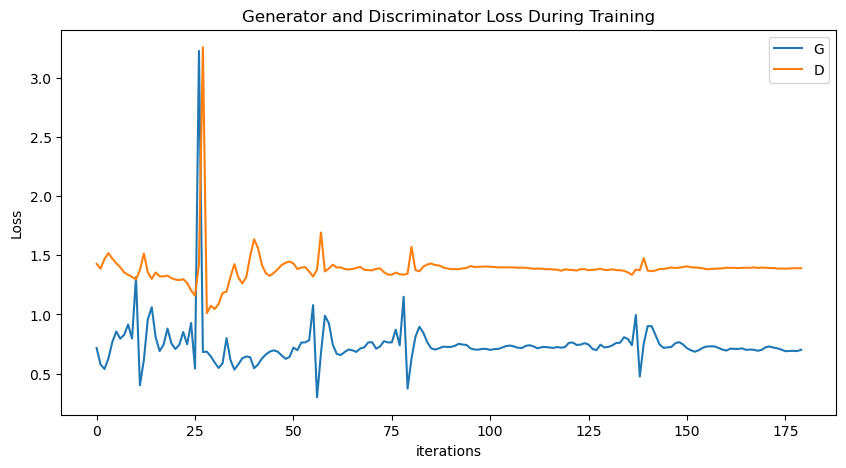

In [8]:
plot_train_metrics(trainer.G_losses, trainer.D_losses)

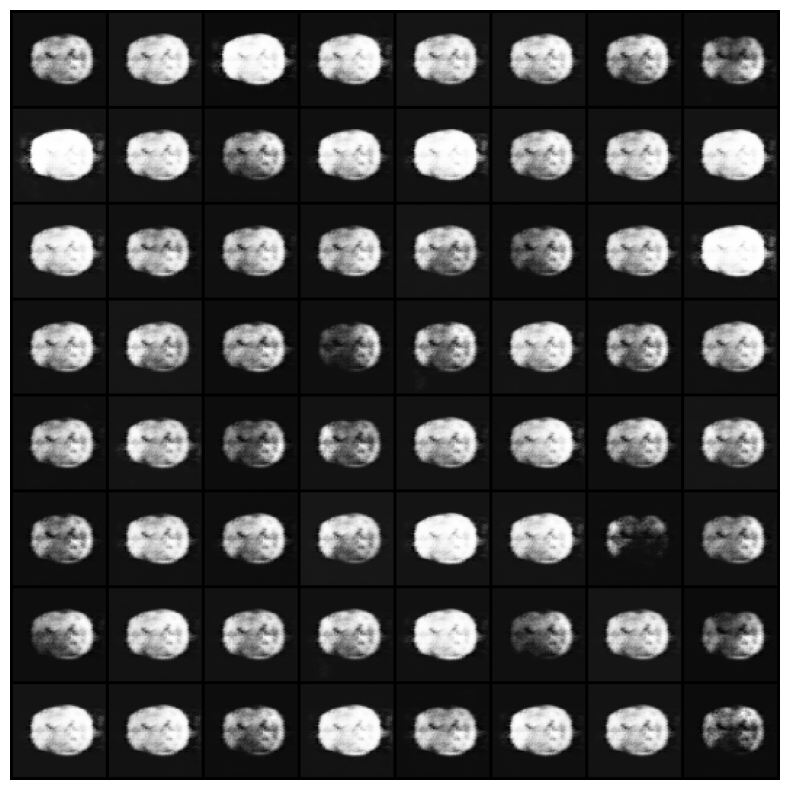

In [9]:
fig = plt.figure(figsize=(10,10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in trainer.img_list]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Save the Trained Model

In [ ]:
param_str = f"_{cfg.NUM_EPOCHS}epochs_{cfg.BATCH_SIZE}batch_G_{cfg.LATENT_SZ}z_{cfg.NGF}feat_{cfg.GLR}lr_D_{cfg.NUM_LEVELS}lvl_{cfg.NDF}feat_{cfg.DLR}lr_{cfg.NEG_SLOPE}lRelu"

torch.save(trainer.best_d_state, f"models/unetgan/{cfg.WINIT}_winit/unetgan_{cfg.BT_CLASS}_Dstate_{param_str}.pth")
torch.save(trainer.best_g_state, f"models/unetgan/{cfg.WINIT}_winit/unetgan_{cfg.BT_CLASS}_Gstate_{param_str}.pth")

In [ ]:
netGval = UNetGenerator(cfg.LATENT_SZ,cfg.NGF,cfg.NGC).to(cfg.DEVICE)
netGval.load_state_dict(torch.load(f"models/unetgan/unetgan_{cfg.BT_CLASS}_Gstate_{param_str}.pth"))
netGval.eval()

fixed_noise = torch.randn(cfg.BATCH_SIZE, cfg.LATENT_SZ, 1, 1, device=cfg.DEVICE)
with torch.no_grad():
    fake = netGval(fixed_noise).detach().cpu()

img = np.transpose(
        vutils.make_grid(fake, padding=2, scale_each=True, normalize=True),
        (1, 2, 0)
    ).cpu().numpy()
title_str = f"{cfg.NUM_EPOCHS}epochs_{cfg.BATCH_SIZE}batch_G_{cfg.LATENT_SZ}z_{cfg.GLR}lr_D_{cfg.DLR}lr"
plt.figure(figsize=(10,10))
plt.title(title_str)
plt.imshow(img)
plt.axis("off")
plt.imsave(f"output/training/unet_{cfg.BT_CLASS}_{title_str}.png",img)

### Save the images

In [ ]:
with torch.no_grad():
    fixed_noise = torch.randn(369, cfg.LATENT_SZ, 1, 1, device=cfg.DEVICE)

fake = netGval(fixed_noise).detach().cpu()

for i in range(fake.size(0)):
           vutils.save_image(fake[i, :, :, :], f'output/unetgan/{cfg.WINIT}_winit/{cfg.BT_CLASS.lower()}/fake/{i}.png')